# Contents

 1. [Introduction](#Introduction)
     1. [Context](#Context)
     1. [Aim](#Aim)
 1. [Code setup](#Code-setup)
     1. [DNN output](#DNN-output)
     1. [Results table - Hemodynamic quantities](#Results-table---Hemodynamic-quantities)
     1. [Recover RPMs](#Recover-RPMs)
     1. [List of all hemodynamic quantities](#List-of-all-hemodynamic-quantities)
 1. [Check test simulations](#Check-test-simulations)
     1. [Check a few simulations](#Check-a-few-simulations)
     1. [Check all simulations](#Check-all-simulations)
         1. [Verify 0D params correspond to `Y` in `normdata.mat`](#Verify-0D-params-correspond-to-Y-in-normdata.mat)
 1. [DNN output](#DNN-output)
     1. [Predicted vs exact plot](#Predicted-vs-exact-plot)
     1. [Errors](#Errors)
         1. [Generate Latex Table](#Generate-Latex-Table)
         1. [Investigate outliers](#Investigate-outliers)
         1. [Investigate relative error dependent on range of parameter values](#Investigate-relative-error-dependent-on-range-of-parameter-values)
         1. [Error as percentage of deviation of max-min](#Error-as-percentage-of-deviation-of-max-min)
 1. [Hemodynamic quantities](#Hemodynamic-quantities)
     1. [Matlab table](#Matlab-table)
         1. [Another format](#Another-format)
         1. [Check](#Check)
     1. [Hemodynamic quantities distribution for exact- vs prediction-based simulations](#Hemodynamic-quantities-distribution-for-exact--vs-prediction-based-simulations)

# Introduction

## Context

The Framework has changed quiet a bit since the last results were obtained (e.g. those in notebook 11). We now have 21 different datasets characterized by different pump speeds. We concatenated those datasets into a new one in order to train a single DNN architecture for different pump configurations. 




In order to allow the DNN to take into account a varying pump speed, we added the pump speed to the vector of features containing Fourier coefficients. A instance of feature for sample $n = 1, \dots, N$ is:

$$[a_{1,0}^{(n)}, a_{1,1}^{(n)}, \dots, a_{1,K}^{(n)}, b_{1,1}^{(n)}, \dots, b_{1,K}^{(n)}, a_{2,0}^{(n)}, a_{2,1}^{(n)}, \dots, a_{2,K}^{(n)}, b_{2,1}^{(n)}, \dots, b_{2,K}^{(n)}, \text{RPM}^{(n)}]$$

where the index $i$ in $a_{i,j}$ indexes the 0D input variable, either SAP or PAS.

We tried several architectures on this big dataset, as presented in the notebook 18. 

## Aim

The selected architecture has 5 hidden layers, 64 neurons. We choose the number of Fourier coefficients $K=50$. We want to analyze the accuracy of the results and the output of the MATLAB postprocessing code for the exact vs predicted simulations performed on the test set. We also generate latex tables for the article.

# Code setup



In [ ]:
rcparams = {
    'axes.titlesize':13,
    'axes.labelsize':9,
    'xtick.labelsize':8,
    'ytick.labelsize':8
}

In [2]:
import numpy as np
import seaborn as sns
from matplotlib.gridspec import GridSpec
import scipy.io as sio
from buildingspy.io.outputfile import Reader
import os

In [3]:
# IPyPublish customization of matplotlib.pyplot and pandas
from ipypublish import nb_setup
plt = nb_setup.setup_matplotlib(output=('pdf','svg'), rcparams=rcparams)
pd = nb_setup.setup_pandas(escape_latex=False)

In [4]:
# Float display precision
pd.set_option('precision', 4)
# Style
sns.set(style='whitegrid')

In [5]:
path = '/media/maousi/Raw/lvad/dnns/'
path_postproc = path + 'dnn_5_layers_64_neurons_test'
path_pred = path + 'dnn_5_layers_64_neurons'

## DNN output

In [6]:
dnn_output_cols = ['Emax', 'Emax0', 'G_Emax', 'k_E']
dnn_output_cols_latex = [r'$E_{max,lv}$', r'$E_{max,lv,0}$',
                         r'$G_{E_{max,lv}}$', r'$k_{E,lv}$']

In [7]:
def load_Ys(path):
    Ytest = pd.read_csv(os.path.join(path, 'Ytest.txt'), sep=' ', header=None)
    Ytestpred = pd.read_csv(os.path.join(path, 'Ytestpred.txt'), sep=' ', header=None)
    Ytest.columns = dnn_output_cols
    Ytestpred.columns = dnn_output_cols
    return Ytest, Ytestpred

In [8]:
Ytest, Yhat = load_Ys(path_pred)
Ytest

,Emax,Emax0,G_Emax,k_E
0,1.8264,2.3606,0.4677,0.0126
1,2.6967,0.3954,0.3970,0.0133
2,0.5683,2.0034,0.3802,0.0113
3,1.5060,1.6586,0.2428,0.0115
4,2.3848,0.3744,0.4593,0.0127
...,...,...,...,...
10495,0.3177,1.3332,0.2707,0.0137
10496,0.7994,0.3133,0.2576,0.0129
10497,1.9519,0.2665,0.2925,0.0119
10498,1.4377,0.9191,0.4519,0.0117


In [9]:
Y = Ytest.join(Yhat, rsuffix='_hat')
Y

,Emax,Emax0,G_Emax,k_E,Emax_hat,Emax0_hat,G_Emax_hat,k_E_hat
0,1.8264,2.3606,0.4677,0.0126,2.1536,2.3415,0.4410,0.0128
1,2.6967,0.3954,0.3970,0.0133,1.8380,0.3977,0.3300,0.0130
2,0.5683,2.0034,0.3802,0.0113,0.5919,2.0469,0.3767,0.0115
3,1.5060,1.6586,0.2428,0.0115,1.5954,1.6300,0.2548,0.0114
4,2.3848,0.3744,0.4593,0.0127,2.2143,0.4399,0.4271,0.0127
...,...,...,...,...,...,...,...,...
10495,0.3177,1.3332,0.2707,0.0137,0.3660,1.3593,0.2402,0.0138
10496,0.7994,0.3133,0.2576,0.0129,0.7593,0.2747,0.2658,0.0130
10497,1.9519,0.2665,0.2925,0.0119,1.8540,0.3154,0.3180,0.0119
10498,1.4377,0.9191,0.4519,0.0117,1.3910,1.0091,0.4132,0.0119


## Results table - Hemodynamic quantities

In [10]:
cols = [
    'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
    'LVEDV', 'LVESV', 'LVESP', 'LVEDP', 'CI', 'PCPW'
]

# Define utility function to format results table
def format_table(table):
    table.index = [
        'Min exact', 'Max exact', 'Mean exact', 'SD exact', 'Min predicted', 
        'Max predicted', 'Mean predicted', 'SD predicted', 'Mean error matrix', 
        'Mean rel error', 'SD error', 'CI min', 'CI max',
    ]
    table.columns = cols
    # Multiply relative error by 100
    #table.loc['Mean rel error * 100', :] = table.loc['Mean rel error * 100', :] * 100

In [11]:
def get_results_table(path):
    df = pd.read_csv(
        os.path.join(path, 'table.csv'), 
        header=None
    )
    format_table(df)
    return df

In [12]:
table = get_results_table(path_postproc)
table

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,LVESP,LVEDP,CI,PCPW
Min exact,57.6688,75.0931,86.6690,68.1907,13.7515,25.6458,7.8023,24.3774,85.9782,28.7388,39.0283,1.0312,0.0000,3.1130
Max exact,94.9977,102.7649,135.1474,89.1086,23.8084,31.8052,19.8100,71.1097,219.9573,166.3375,135.1474,11.9763,2.3927,16.6652
Mean exact,69.2257,92.8353,114.3225,82.0916,17.0144,27.5706,11.7363,53.0081,141.1367,67.7555,112.9530,3.6567,-1.0849,7.4277
SD exact,4.5338,4.6996,10.7038,3.3103,1.6742,1.0584,1.9856,9.1554,22.0268,22.4940,14.0676,1.7004,0.6848,2.3049
Min predicted,57.4163,74.4534,88.0553,66.7900,13.7899,25.6601,7.8425,24.2501,85.5822,29.1736,39.2160,1.0467,0.0000,3.1500
Max predicted,93.2529,102.5510,134.6848,88.9734,24.0886,32.0775,20.1225,70.1405,216.6377,159.4064,134.6848,12.8516,2.3692,17.3309
Mean predicted,69.3716,92.6611,114.0069,81.9883,17.0562,27.5929,11.7878,52.5529,141.9898,68.8996,112.4586,3.7129,-1.0722,7.4869
SD predicted,4.6310,4.7497,10.7281,3.3634,1.6992,1.0708,2.0166,9.3039,22.6446,23.2989,14.4539,1.7477,0.6844,2.3407
Mean error matrix,0.7890,0.3618,0.6275,0.3023,0.0764,0.0495,0.0917,1.0445,1.6184,2.1522,0.8813,0.1116,0.0251,0.1070
Mean rel error,0.0112,0.0040,0.0056,0.0037,0.0043,0.0018,0.0075,0.0204,0.0111,0.0317,0.0088,0.0294,0.0497,0.0138


## Recover RPMs

In [13]:
import scipy.io as sio

In [14]:
path_normdata = os.path.join(path, 'normdata.mat')
d = sio.loadmat(path_normdata)
# Un-normalize
rpms = d['Xtest'][:, -1] * (d['Xmaxs'][:, -1] - d['Xmins'][:, -1]) + d['Xmins'][:, -1]
rpms = rpms.astype(int)
del d

rpms

array([5100, 5700, 5900, ..., 5800, 5100, 4200])

In [15]:
rpms.shape

(10500,)

## List of all hemodynamic quantities

In [16]:
def load_X_data(path):
    Xhat = pd.read_csv(os.path.join(path, 'Xpredicted.csv'), header=None)
    X = pd.read_csv(os.path.join(path, 'Xexact.csv'), header=None)
    # Format columns
    Xhat.columns = cols
    X.columns = cols
    # Take abs (values of cardiac index are negative)
    X.CI = X.CI.apply(np.abs)
    Xhat.CI = Xhat.CI.apply(np.abs)
    # Join
    X = X.join(Xhat, rsuffix='_hat')
    return X

In [17]:
X = load_X_data(path_postproc)
X['RPM'] = rpms
X

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,...,PAPS_hat,PAPD_hat,LVEF_hat,LVEDV_hat,LVESV_hat,LVESP_hat,LVEDP_hat,CI_hat,PCPW_hat,RPM
0,65.5738,98.7117,126.0509,85.0420,15.7233,26.6792,10.2453,67.8674,122.0103,39.2050,...,26.6985,10.2901,69.3942,121.6095,37.2196,125.3614,2.1120,1.5011,5.6796,5100
1,66.1505,87.2688,96.4546,82.6759,16.4063,27.1727,11.0231,49.6925,133.1973,67.0083,...,27.1789,11.1496,48.0698,136.2604,70.7603,82.8549,3.2598,0.0000,6.9809,5700
2,69.5805,93.7993,109.5179,85.9400,14.1772,26.0335,8.2491,61.4463,103.1451,39.7662,...,26.0562,8.2851,61.0752,101.7302,39.5983,109.2267,1.4182,0.3995,3.6690,5900
3,65.5738,94.5035,109.4490,87.0307,14.7522,26.3061,8.9753,55.8186,114.8151,50.7269,...,26.2988,8.9510,57.2136,115.4518,49.3977,109.3828,1.7354,0.4251,4.2896,5800
4,79.6432,87.7773,101.3072,81.0124,17.9702,28.0573,12.9266,43.2542,156.8696,89.0169,...,28.0246,12.8959,42.8130,156.4050,89.4434,102.1457,4.6812,0.5118,8.8370,5100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10495,68.9655,93.0214,119.7953,79.6344,19.2986,29.0461,14.4248,49.0048,150.4972,76.7464,...,29.0927,14.5645,49.6454,149.9840,75.5238,119.0347,5.8803,1.6976,10.3872,4400
10496,78.4314,79.9733,96.5536,71.6832,22.1097,30.7469,17.7912,30.1364,188.3760,131.6062,...,30.9418,18.3282,29.4337,187.8036,132.5260,94.2957,10.2766,0.7450,14.9873,4300
10497,66.1166,87.5992,97.2455,82.7761,15.9722,26.7656,10.5755,49.0094,140.7627,71.7757,...,26.7566,10.5438,49.0256,140.9204,71.8333,70.0701,2.8624,0.0000,6.0610,5800
10498,66.6667,92.1418,115.6519,80.3867,16.6552,27.2785,11.3435,48.6075,149.3437,76.7514,...,27.3260,11.3885,49.5009,146.8050,74.1352,115.7766,3.4263,1.0494,7.0987,5100


# Check test simulations

## Check a few simulations

In [18]:
def time_range(tmin, tmax, t, signal):
    ids = np.where(np.logical_and(t >= tmin, t <= tmax))
    return t[ids], signal[ids]

def read_simulations(paths, rpms, variables, tmin, tmax):
    data = {}
    for file, rpm in zip(paths, rpms):
        reader = Reader(file, 'dymola')
        data[rpm] = [
            time_range(tmin, tmax, *reader.values(v)) for v in variables
        ]
    return data

In [19]:
def plot_simulations(data):
    fig, ax = plt.subplots(len(data), 1, figsize=(10, 10))

    for i, (rpm_c, data) in enumerate(data.items()):
        ax1 = ax[i]
        ax2 = ax1.twinx()

        (t1, pressure), (t2, valve_flow), (t3, aortic_flow), (t4, rpm), (t5, lv_pressure) = data
        #(t1, pressure), (t2, valve_flow), (t3, arotic_flow), (t4, rpm) = data[0], data[1], data[2], data[3]
        l1, = ax1.plot(t4, rpm/100, 'k--', linewidth=1)
        l2, = ax1.plot(t1, pressure, 'b')
        l3, = ax1.plot(t1, lv_pressure, '--', linewidth=0.5)
        l4, = ax2.plot(t2, valve_flow, 'g--', linewidth=1)
        l5, = ax2.plot(t3, aortic_flow, 'r')
        #ax2.set_ylim([min(flow)-25, max(flow)+25])
        #ax1.set_ylim(-5, max(max(pressure), max(flow)))
        #ax2.plot(t2, flow)

        # Manage x axis
        if i == 2:
            ax1.set_xlabel('Time [s]')
        else:
            pass#ax1.set_xticks([])
        
        ax1.set_ylabel('Systemic pressure [mmHg]\nLV pressure [mmHg]\nPump speed [RPM/100]')
        ax2.set_ylabel('Aortic flow [ml/s]\nValve flow [ml/s]')
        #ax1.yaxis.label.set_color('b')
        # Align the grids
        #ax2.set_yticks(np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks())))
        ax2.grid(False)
        ax2.set_ylim([-5, 1.5*max(aortic_flow)])
        #ax1.set_title('RPM mean = {}'.format(rpm_c))

    plt.subplots_adjust(hspace=.2)
    ax2.legend(handles = [l1,l2,l3, l4, l5], labels=['LVAD speed', 'SAP', 'LV pressure', 'Aortic valve flow', 'Aortic flow'], 
               bbox_to_anchor=(0.5, -0.35), fancybox=False, shadow=False, ncol=5, loc='center')

In [20]:
variables = ['SystemicArteries.PC', 'AorticValve.Inlet.Q',
             'SystemicArteries.Inlet.Q', 'LVAD.RPM', 'LeftVentricle.Inlet.P']

path_sims = '/media/maousi/Raw/lvad/dnns/dnn_6_layers_64_neurons_test/outputs'

simulation_ids = [821, 2, 250]

In [21]:
paths = [
    os.path.join(path_sims, 'Ursino1998Model_VAD2_output_{}_exact.mat'.format(n))
    for n in simulation_ids
]
plot_rpms = rpms[simulation_ids]
data = read_simulations(paths, plot_rpms, variables, 26.0, 30.0)

In [22]:
print('RPMs corresponding to picked simulations:', list(data.keys()))

RPMs corresponding to picked simulations: [4100, 5900, 4000]


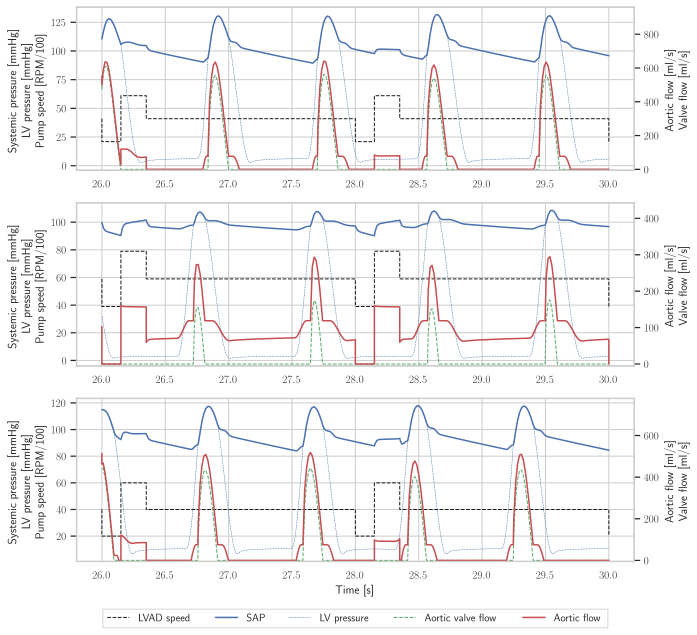

In [23]:
plot_simulations(data)

## Check all simulations


**WARNING: you should transform the cells below to raw cells once you checked results since this takes a long time**.  

---

### Verify 0D params correspond to `Y` in `normdata.mat` 

# DNN output

In [24]:
def plot_dnn_performance(Ytest, Yhat):
    
    fig, ax = plt.subplots(2, 2, figsize=(9,6))
    axlst = ax.ravel()
    colors = sns.color_palette(n_colors=4)
    
    for i, (col, color) in enumerate(zip(dnn_output_cols, colors)):
        axlst[i].scatter(Ytest.loc[:, col], Yhat.loc[:, col], s=3, color=color)
        axlst[i].set_title(dnn_output_cols_latex[i])
        axlst[i].set_xlabel(r'Exact')
        axlst[i].set_ylabel(r'Predicted')
    
    offset = .0002
    ax[1, 1].set_xlim([Ytest.loc[:, 'k_E'].min()-offset, Ytest.loc[:, 'k_E'].max()+offset])
    ax[1, 1].set_ylim([Yhat.loc[:, 'k_E'].min()-offset, Yhat.loc[:, 'k_E'].max()+offset])
    
    plt.tight_layout()
    return fig, ax

## Predicted vs exact plot

The plot of exact vs predicted parameters would yield a figure with 10,000 points, which renders a 37MB-file. We thus subsample the points:

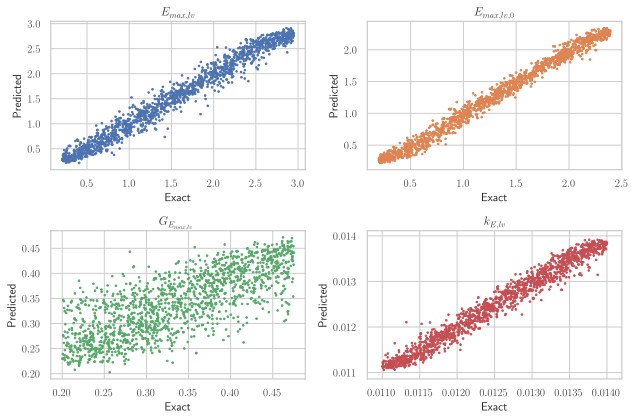

In [25]:
# Subsampling
frac = 0.15
N = round(frac * Ytest.shape[0])
idxsub = np.random.choice(Ytest.shape[0], size=N)
fig, ax = plot_dnn_performance(Ytest.iloc[idxsub], Yhat.iloc[idxsub])
plt.savefig('figs/dnn_predicted_vs_exact.eps')

## Errors

We compute the relative error of the DNN output variable $y_i$ as follows:

$$\text{rel err} = \frac{|y_i - \hat y_i|}{y_i}$$

In [26]:
Y

,Emax,Emax0,G_Emax,k_E,Emax_hat,Emax0_hat,G_Emax_hat,k_E_hat
0,1.8264,2.3606,0.4677,0.0126,2.1536,2.3415,0.4410,0.0128
1,2.6967,0.3954,0.3970,0.0133,1.8380,0.3977,0.3300,0.0130
2,0.5683,2.0034,0.3802,0.0113,0.5919,2.0469,0.3767,0.0115
3,1.5060,1.6586,0.2428,0.0115,1.5954,1.6300,0.2548,0.0114
4,2.3848,0.3744,0.4593,0.0127,2.2143,0.4399,0.4271,0.0127
...,...,...,...,...,...,...,...,...
10495,0.3177,1.3332,0.2707,0.0137,0.3660,1.3593,0.2402,0.0138
10496,0.7994,0.3133,0.2576,0.0129,0.7593,0.2747,0.2658,0.0130
10497,1.9519,0.2665,0.2925,0.0119,1.8540,0.3154,0.3180,0.0119
10498,1.4377,0.9191,0.4519,0.0117,1.3910,1.0091,0.4132,0.0119


In [27]:
Yerr = pd.DataFrame()
for col in dnn_output_cols:
    Yerr[col] = np.abs(Y[col] - Y[col+'_hat'])
Yerr

,Emax,Emax0,G_Emax,k_E
0,0.3272,0.0190,0.0266,1.5024e-04
1,0.8587,0.0023,0.0671,2.5212e-04
2,0.0235,0.0435,0.0035,2.2890e-04
3,0.0893,0.0286,0.0119,8.5473e-05
4,0.1705,0.0655,0.0322,6.1363e-05
...,...,...,...,...
10495,0.0483,0.0261,0.0306,8.9163e-05
10496,0.0401,0.0386,0.0082,1.3482e-04
10497,0.0979,0.0489,0.0256,2.8916e-05
10498,0.0467,0.0900,0.0387,2.1880e-04


In [28]:
statserr = Yerr.describe().loc[['mean', 'min', '50%', 'max', 'std'], :].rename(
    index={'min':'Min Err', 'max': 'Max Err', 'mean': 'Mean Err', 'std': 'Std Err', '50%': 'Median Err'},
    columns=dict(zip(Yerr.columns, dnn_output_cols_latex))
)
statserr

,"$E_{max,lv}$","$E_{max,lv,0}$","$G_{E_{max,lv}}$","$k_{E,lv}$"
Mean Err,1.1072e-01,6.9287e-02,3.8577e-02,1.1657e-04
Min Err,2.0469e-05,1.2390e-06,2.1181e-05,6.8495e-09
Median Err,9.1174e-02,5.8032e-02,3.0427e-02,9.3778e-05
Max Err,9.1317e-01,3.5221e-01,2.0203e-01,9.8770e-04
Std Err,8.8666e-02,5.2360e-02,3.1945e-02,9.5562e-05


In [29]:
Yrelerr = pd.DataFrame()
for col in dnn_output_cols:
    Yrelerr[col] = np.abs(Y[col] - Y[col+'_hat']) / Y[col]
Yrelerr

,Emax,Emax0,G_Emax,k_E
0,0.1791,0.0081,0.0570,0.0119
1,0.3184,0.0058,0.1690,0.0190
2,0.0414,0.0217,0.0092,0.0203
3,0.0593,0.0172,0.0492,0.0074
4,0.0715,0.1749,0.0701,0.0048
...,...,...,...,...
10495,0.1520,0.0196,0.1129,0.0065
10496,0.0502,0.1233,0.0318,0.0104
10497,0.0501,0.1836,0.0874,0.0024
10498,0.0325,0.0979,0.0856,0.0188


In [30]:
statsrelerr = Yrelerr.describe().loc[['mean', 'min', '50%', 'max', 'std'], :].rename(
    index={'min':'Min Rel Err', 'max': 'Max Rel Err', 'mean': 'Mean Rel Err', 'std': 'Std Rel Err', '50%': 'Median Rel Err'},
    columns=dict(zip(Yrelerr.columns, dnn_output_cols_latex))
)
statsrelerr

,"$E_{max,lv}$","$E_{max,lv,0}$","$G_{E_{max,lv}}$","$k_{E,lv}$"
Mean Rel Err,1.0070e-01,7.5786e-02,1.2432e-01,9.3253e-03
Min Rel Err,1.7023e-05,1.2592e-06,6.1976e-05,5.1817e-07
Median Rel Err,6.2314e-02,4.7050e-02,9.1594e-02,7.5467e-03
Max Rel Err,2.9660e+00,1.0621e+00,9.0908e-01,7.9308e-02
Std Rel Err,1.2819e-01,8.6250e-02,1.1826e-01,7.5791e-03


In [31]:
def get_tab3_line(type_='exact', operation=np.mean, op_desc='Mean'):
    cols = dnn_output_cols
    if type_ == 'pred':
        cols = [c + '_hat' for c in dnn_output_cols]
        
    return pd.Series(
        [operation(Y[c]) for c in cols],
        index=dnn_output_cols_latex,
        name=op_desc + r'\textsubscript{'+ type_ + '}'
    )

In [32]:
extension = [
    get_tab3_line(*args)
    for args in [
        ('exact', np.min, 'Min'),
        ('exact', np.max, 'Max'),
        ('exact', np.mean, 'Mean'),
        ('pred', np.min, 'Min'),
        ('pred', np.max, 'Max'),
        ('pred', np.mean, 'Mean'),
    ]
]

extension = pd.DataFrame(extension)
tab3 = pd.concat((extension, statserr, statsrelerr))
tab3

,"$E_{max,lv}$","$E_{max,lv,0}$","$G_{E_{max,lv}}$","$k_{E,lv}$"
Min\textsubscript{exact},2.0014e-01,2.0013e-01,2.0002e-01,1.1000e-02
Max\textsubscript{exact},2.9493e+00,2.3919e+00,4.7499e-01,1.4000e-02
Mean\textsubscript{exact},1.5793e+00,1.2979e+00,3.3773e-01,1.2491e-02
Min\textsubscript{pred},2.0400e-01,2.0778e-01,2.0281e-01,1.1055e-02
Max\textsubscript{pred},2.9114e+00,2.3794e+00,4.7182e-01,1.3972e-02
Mean\textsubscript{pred},1.5581e+00,1.2658e+00,3.4161e-01,1.2467e-02
Mean Err,1.1072e-01,6.9287e-02,3.8577e-02,1.1657e-04
Min Err,2.0469e-05,1.2390e-06,2.1181e-05,6.8495e-09
Median Err,9.1174e-02,5.8032e-02,3.0427e-02,9.3778e-05
Max Err,9.1317e-01,3.5221e-01,2.0203e-01,9.8770e-04


### Generate Latex Table

In [44]:
import math
# http://randlet.com/blog/python-significant-figures-format/
def to_precision(x,p):
    """
    returns a string representation of x formatted with a precision of p

    Based on the webkit javascript implementation taken from here:
    https://code.google.com/p/webkit-mirror/source/browse/JavaScriptCore/kjs/number_object.cpp
    """

    x = float(x)

    if x == 0.:
        return "0." + "0"*(p-1)

    out = []

    if x < 0:
        out.append("-")
        x = -x

    e = int(math.log10(x))
    tens = math.pow(10, e - p + 1)
    n = math.floor(x/tens)

    if n < math.pow(10, p - 1):
        e = e -1
        tens = math.pow(10, e - p+1)
        n = math.floor(x / tens)

    if abs((n + 1.) * tens - x) <= abs(n * tens -x):
        n = n + 1

    if n >= math.pow(10,p):
        n = n / 10.
        e = e + 1

    m = "%.*g" % (p, n)

    if e < -2 or e >= p:
        out.append(m[0])
        if p > 1:
            out.append(".")
            out.extend(m[1:p])
        out.append('e')
        if e > 0:
            out.append("+")
        out.append(str(e))
    elif e == (p -1):
        out.append(m)
    elif e >= 0:
        out.append(m[:e+1])
        if e+1 < len(m):
            out.append(".")
            out.extend(m[e+1:])
    else:
        out.append("0.")
        out.extend(["0"]*-(e+1))
        out.append(m)

    return "".join(out)

In [55]:
#formatter = lambda n: np.format_float_scientific(n, precision=2)
#formatter = '{:.4f}'.format
formatter = lambda e: to_precision(e, 3)
caption = """Relative absolute errors of the DNN output for the six layers and sixty-four neurons architecture"""
label = "tab:dnn_relerr"
latex = tab3.to_latex(float_format=formatter, caption=caption, label=label)
latex = latex.replace('\\toprule', '\hline')
latex = latex.replace('\\midrule', '\hline')
latex = latex.replace('\\bottomrule', '\hline')
with open('data/dnn_relerr.tex', 'w') as f:
    f.write(latex)
    
print(latex)

\begin{table}
\centering
\caption{Relative absolute errors of the DNN output for the six layers and sixty-four neurons architecture}
\label{tab:dnn_relerr}
\begin{tabular}{lrrrr}
\hline
{} &  $E_{max,lv}$ &  $E_{max,lv,0}$ &  $G_{E_{max,lv}}$ &  $k_{E,lv}$ \\
\hline
Min\textsubscript{exact}  &         0.200 &           0.200 &             0.200 &      0.0110 \\
Max\textsubscript{exact}  &          2.95 &            2.39 &             0.475 &      0.0140 \\
Mean\textsubscript{exact} &          1.58 &            1.30 &             0.338 &      0.0125 \\
Min\textsubscript{pred}   &         0.204 &           0.208 &             0.203 &      0.0111 \\
Max\textsubscript{pred}   &          2.91 &            2.38 &             0.472 &      0.0140 \\
Mean\textsubscript{pred}  &          1.56 &            1.27 &             0.342 &      0.0125 \\
Mean Err                  &         0.111 &          0.0693 &            0.0386 &     1.17e-4 \\
Min Err                   &       2.05e-5 &         1.

### Investigate outliers

In [34]:
outlier_mask = Yerr.Emax > 0.2
outlier_mask.sum()

1539

In [35]:
Y[outlier_mask]

,Emax,Emax0,G_Emax,k_E,Emax_hat,Emax0_hat,G_Emax_hat,k_E_hat
0,1.8264,2.3606,0.4677,0.0126,2.1536,2.3415,0.4410,0.0128
1,2.6967,0.3954,0.3970,0.0133,1.8380,0.3977,0.3300,0.0130
9,1.1379,0.5944,0.4236,0.0118,0.8489,0.5866,0.4232,0.0116
13,2.8357,0.8435,0.3478,0.0139,2.6272,0.7124,0.3858,0.0136
15,2.7225,0.6284,0.4086,0.0122,2.4790,0.5873,0.4029,0.0119
...,...,...,...,...,...,...,...,...
10461,2.4760,0.7901,0.3271,0.0129,2.7016,0.6891,0.4060,0.0130
10477,2.0103,1.9233,0.2382,0.0113,2.2375,1.8214,0.2846,0.0112
10479,0.9972,2.3332,0.4399,0.0111,0.7708,2.2990,0.4420,0.0112
10491,2.3668,0.6642,0.3762,0.0111,2.1438,0.5582,0.4446,0.0111


### Investigate relative error dependent on range of parameter values

We now want to generate measured values with a fixed relative error, given the true values, in order to generate bounds and see how the range of the parameter affects the relative error:

In [36]:
def get_bounds(real, relerr=5):
    delta = relerr * real / 100
    lower = real - delta
    upper = real + delta
    return lower, upper

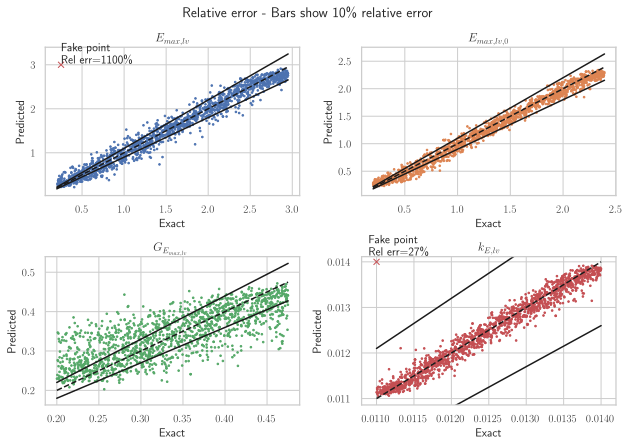

In [37]:
def plot_bounds(minval, maxval, ax, relerr):
    p = np.linspace(minval, maxval, 100)
    upper, lower = get_bounds(p, relerr)
    ax.plot(p, p, 'k--')
    ax.plot(p, lower, 'k', p, upper, 'k')

relerr = 10
fig, ax = plot_dnn_performance(Ytest.iloc[idxsub], Yhat.iloc[idxsub])
plot_bounds(0.2, 2.95, ax[0, 0], relerr)
plot_bounds(0.2, 2.392, ax[0, 1], relerr)
plot_bounds(0.2, 0.475, ax[1, 0], relerr)
plot_bounds(0.011, 0.014, ax[1, 1], relerr)

fake_pt1_x, fake_pt1_y = 0.011, 0.014
relerr_pt1 = (fake_pt1_y-fake_pt1_x) / fake_pt1_x * 100
ax[1, 1].plot(fake_pt1_x, fake_pt1_y, 'rx')
ax[1, 1].text(fake_pt1_x*.99, fake_pt1_y*1.01, f'Fake point\nRel err={relerr_pt1:.0f}\%')

fake_pt2_x, fake_pt2_y = 0.25, 3
relerr_pt2 = (fake_pt2_y-fake_pt2_x) / fake_pt2_x * 100
ax[0, 0].plot(fake_pt2_x, fake_pt2_y, 'rx')
ax[0, 0].text(fake_pt2_x*.99, fake_pt2_y*1.01, f'Fake point\nRel err={relerr_pt2:.0f}\%')

plt.suptitle(f'Relative error - Bars show {relerr}\% relative error', y=1.03)
plt.savefig('figs/relerr_bounds.png', bbox_inches='tight', dpi=300)

Problems:

* The bars representing 5% relative error are not parallel
* The relative error depends on the range of the parameter of interest

We should probably assess performance with a different metric.

### Error as percentage of deviation of max-min

In [38]:
def bounds_error_range(minval, maxval, exact, error=5):
    rng = maxval - minval
    delta = rng * error / 100
    up = exact + delta
    low = exact - delta
    return up, low

In [39]:
def plot_bounds_range(minval, maxval, ax, error=5):
    exact = np.linspace(minval, maxval, 100)
    up, low = bounds_error_range(minval, maxval, exact, error)
    ax.plot(exact, up, 'k', exact, low, 'k', exact, exact, '--k')

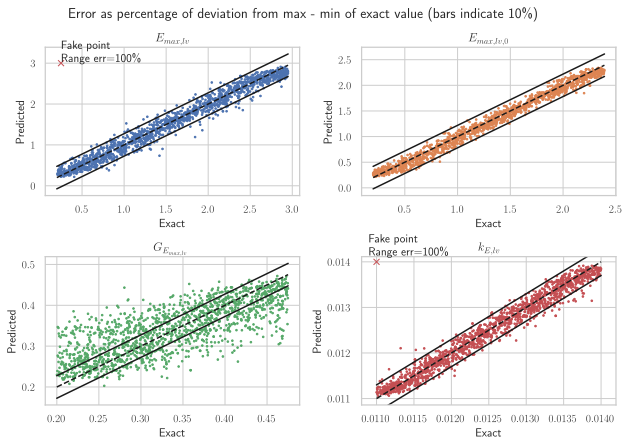

In [40]:
fig, ax = plot_dnn_performance(Ytest.iloc[idxsub], Yhat.iloc[idxsub])
err = 10
plot_bounds_range(0.2, 2.95, ax[0, 0], err)
plot_bounds_range(0.2, 2.392, ax[0, 1], err)
plot_bounds_range(0.2, 0.475, ax[1, 0], err)
plot_bounds_range(0.011, 0.014, ax[1, 1], err)


fake_pt1_x, fake_pt1_y = 0.011, 0.014
range_err_pt1 = (fake_pt1_y-fake_pt1_x) / (.014 - .011) * 100
ax[1, 1].plot(fake_pt1_x, fake_pt1_y, 'rx')
ax[1, 1].text(fake_pt1_x*.99, fake_pt1_y*1.01, f'Fake point\nRange err={range_err_pt1:.0f}\%')

fake_pt2_x, fake_pt2_y = 0.25, 3
range_err_pt2 = (fake_pt2_y-fake_pt2_x) / (2.95 - .2) * 100
ax[0, 0].plot(fake_pt2_x, fake_pt2_y, 'rx')
ax[0, 0].text(fake_pt2_x*.99, fake_pt2_y*1.01, f'Fake point\nRange err={range_err_pt2:.0f}\%')

plt.suptitle(f'Error as percentage of deviation from max - min of exact value (bars indicate {err}\%)', y=1.03)
plt.savefig('figs/error_range.png', bbox_inches='tight', dpi=300)

# Hemodynamic quantities

## Matlab table

In [41]:
table

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,LVESP,LVEDP,CI,PCPW
Min exact,57.6688,75.0931,86.6690,68.1907,13.7515,25.6458,7.8023,24.3774,85.9782,28.7388,39.0283,1.0312,0.0000,3.1130
Max exact,94.9977,102.7649,135.1474,89.1086,23.8084,31.8052,19.8100,71.1097,219.9573,166.3375,135.1474,11.9763,2.3927,16.6652
Mean exact,69.2257,92.8353,114.3225,82.0916,17.0144,27.5706,11.7363,53.0081,141.1367,67.7555,112.9530,3.6567,-1.0849,7.4277
SD exact,4.5338,4.6996,10.7038,3.3103,1.6742,1.0584,1.9856,9.1554,22.0268,22.4940,14.0676,1.7004,0.6848,2.3049
Min predicted,57.4163,74.4534,88.0553,66.7900,13.7899,25.6601,7.8425,24.2501,85.5822,29.1736,39.2160,1.0467,0.0000,3.1500
Max predicted,93.2529,102.5510,134.6848,88.9734,24.0886,32.0775,20.1225,70.1405,216.6377,159.4064,134.6848,12.8516,2.3692,17.3309
Mean predicted,69.3716,92.6611,114.0069,81.9883,17.0562,27.5929,11.7878,52.5529,141.9898,68.8996,112.4586,3.7129,-1.0722,7.4869
SD predicted,4.6310,4.7497,10.7281,3.3634,1.6992,1.0708,2.0166,9.3039,22.6446,23.2989,14.4539,1.7477,0.6844,2.3407
Mean error matrix,0.7890,0.3618,0.6275,0.3023,0.0764,0.0495,0.0917,1.0445,1.6184,2.1522,0.8813,0.1116,0.0251,0.1070
Mean rel error,0.0112,0.0040,0.0056,0.0037,0.0043,0.0018,0.0075,0.0204,0.0111,0.0317,0.0088,0.0294,0.0497,0.0138


In [42]:
def rename(name):
    if name.endswith('exact') or name.endswith('predicted'):
        suffix = name.split(' ')[1]
        newname = name.split(' ')[0] + r'\textsubscript{'+suffix+'}'
        return newname
    return name

In [43]:
table_latex = table[['LVEF', 'LVEDV', 'LVESV', 'LVEDP', 'LVESP', 'PCPW']]

table_latex.index = [
    r'Min\textsubscript{exact}',
    r'Max\textsubscript{exact}',
    r'Mean\textsubscript{exact}',
    r'SD\textsubscript{exact}',
    r'Min\textsubscript{predicted}',
    r'Max\textsubscript{predicted}',
    r'Mean\textsubscript{predicted}',
    r'SD\textsubscript{predicted}',
    'Mean Err',
    'Mean Rel Err',
    'Err SD',
    'Err CI min',
    'Err CI max'
]

table_latex

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Min\textsubscript{exact},24.3774,85.9782,28.7388,1.0312,39.0283,3.1130
Max\textsubscript{exact},71.1097,219.9573,166.3375,11.9763,135.1474,16.6652
Mean\textsubscript{exact},53.0081,141.1367,67.7555,3.6567,112.9530,7.4277
SD\textsubscript{exact},9.1554,22.0268,22.4940,1.7004,14.0676,2.3049
Min\textsubscript{predicted},24.2501,85.5822,29.1736,1.0467,39.2160,3.1500
Max\textsubscript{predicted},70.1405,216.6377,159.4064,12.8516,134.6848,17.3309
Mean\textsubscript{predicted},52.5529,141.9898,68.8996,3.7129,112.4586,7.4869
SD\textsubscript{predicted},9.3039,22.6446,23.2989,1.7477,14.4539,2.3407
Mean Err,1.0445,1.6184,2.1522,0.1116,0.8813,0.1070
Mean Rel Err,0.0204,0.0111,0.0317,0.0294,0.0088,0.0138


In [45]:
caption = 'Hemodynamic quantities between simulation with predicted and exact parameters'
label = 'tab:hemo'
formatter = lambda x: to_precision(x, 3)
#formatter = '{:.3g}'.format
#formatter = lambda x: np.format_float_scientific(x, precision=2, )
latex = table_latex.to_latex(float_format=formatter, label=label, caption=caption)
latex = latex.replace('\\toprule', '\hline')
latex = latex.replace('\\midrule', '\hline')
latex = latex.replace('\\bottomrule', '\hline')
with open('data/dnn_hemodynamic_table.tex', 'w') as f:
    f.write(latex)
    
print(latex)

\begin{table}
\centering
\caption{Hemodynamic quantities between simulation with predicted and exact parameters}
\label{tab:hemo}
\begin{tabular}{lrrrrrr}
\hline
{} &   LVEF &  LVEDV &  LVESV &  LVEDP &   LVESP &   PCPW \\
\hline
Min\textsubscript{exact}      &   24.4 &   86.0 &   28.7 &   1.03 &    39.0 &   3.11 \\
Max\textsubscript{exact}      &   71.1 &    220 &    166 &   12.0 &     135 &   16.7 \\
Mean\textsubscript{exact}     &   53.0 &    141 &   67.8 &   3.66 &     113 &   7.43 \\
SD\textsubscript{exact}       &   9.16 &   22.0 &   22.5 &   1.70 &    14.1 &   2.30 \\
Min\textsubscript{predicted}  &   24.3 &   85.6 &   29.2 &   1.05 &    39.2 &   3.15 \\
Max\textsubscript{predicted}  &   70.1 &    217 &    159 &   12.9 &     135 &   17.3 \\
Mean\textsubscript{predicted} &   52.6 &    142 &   68.9 &   3.71 &     112 &   7.49 \\
SD\textsubscript{predicted}   &   9.30 &   22.6 &   23.3 &   1.75 &    14.5 &   2.34 \\
Mean Err                      &   1.04 &   1.62 &   2.15 &  0.112 

### Another format


In [61]:
hemo_quantities = ['LVEF', 'LVEDV', 'LVESV', 'LVEDP', 'LVESP', 'PCPW']

In [62]:
table_latex = table[hemo_quantities]
table_latex
table_latex['type'] = 'exact'
table_latex.loc[table_latex.index.str.contains('predicted'), 'type'] = 'predicted'

table_latex = table_latex.pivot(columns='type')
table_latex

/home/maousi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/maousi/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


LVEF               LVEDV               LVESV            \
type                 exact predicted     exact predicted     exact predicted   
CI max              1.0645       NaN    1.6475       NaN    2.1933       NaN   
CI min              1.0246       NaN    1.5892       NaN    2.1111       NaN   
Max exact          71.1097       NaN  219.9573       NaN  166.3375       NaN   
Max predicted          NaN   70.1405       NaN  216.6377       NaN  159.4064   
Mean error matrix   1.0445       NaN    1.6184       NaN    2.1522       NaN   
Mean exact         53.0081       NaN  141.1367       NaN   67.7555       NaN   
Mean predicted         NaN   52.5529       NaN  141.9898       NaN   68.8996   
Mean rel error      0.0204       NaN    0.0111       NaN    0.0317       NaN   
Min exact          24.3774       NaN   85.9782       NaN   28.7388       NaN   
Min predicted          NaN   24.2501       NaN   85.5822       NaN   29.1736   
SD error            1.0426       NaN    1.5228       NaN    2.1491       NaN   
SD exact            9.1554       NaN   22.0268       NaN   22.4940       NaN   
SD predicted           NaN    9.3039       NaN   22.6446       NaN   23.2989   

                     LVEDP               LVESP               PCPW            
type                 exact predicted     exact predicted    exact predicted  
CI max              0.1140       NaN    0.9080       NaN   0.1091       NaN  
CI min              0.1092       NaN    0.8547       NaN   0.1049       NaN  
Max exact          11.9763       NaN  135.1474       NaN  16.6652       NaN  
Max predicted          NaN   12.8516       NaN  134.6848      NaN   17.3309  
Mean error matrix   0.1116       NaN    0.8813       NaN   0.1070       NaN  
Mean exact          3.6567       NaN  112.9530       NaN   7.4277       NaN  
Mean predicted         NaN    3.7129       NaN  112.4586      NaN    7.4869  
Mean rel error      0.0294       NaN    0.0088       NaN   0.0138       NaN  
Min exact           1.0312       NaN   39.0283       NaN   3.1130       NaN  
Min predicted          NaN    1.0467       NaN   39.2160      NaN    3.1500  
SD error            0.1267       NaN    1.3924       NaN   0.1087       NaN  
SD exact            1.7004       NaN   14.0676       NaN   2.3049       NaN  
SD predicted           NaN    1.7477       NaN   14.4539      NaN    2.3407

In [47]:
caption = 'Hemodynamic quantities between simulation with predicted and exact parameters'
label = 'tab:hemo'
formatter = lambda x: ' ' if pd.isna(x) else to_precision(x, 3)
#formatter = '{:.3g}'.format
#formatter = lambda x: np.format_float_scientific(x, precision=2, )
latex = table_latex.to_latex(float_format=formatter, label=label, caption=caption)
latex = latex.replace('\\toprule', '\hline')
latex = latex.replace('\\midrule', '\hline')
latex = latex.replace('\\bottomrule', '\hline')
print(latex)

\begin{table}
\centering
\caption{Hemodynamic quantities between simulation with predicted and exact parameters}
\label{tab:hemo}
\begin{tabular}{lrrrrrrrrrrrr}
\hline
{} & \multicolumn{2}{l}{LVEF} & \multicolumn{2}{l}{LVEDV} & \multicolumn{2}{l}{LVESV} & \multicolumn{2}{l}{LVEDP} & \multicolumn{2}{l}{LVESP} & \multicolumn{2}{l}{PCPW} \\
type &  exact & predicted &  exact & predicted &  exact & predicted &  exact & predicted &   exact & predicted &  exact & predicted \\
\hline
CI max            &   1.06 &           &   1.65 &           &   2.19 &           &  0.114 &           &   0.908 &           &  0.109 &           \\
CI min            &   1.02 &           &   1.59 &           &   2.11 &           &  0.109 &           &   0.855 &           &  0.105 &           \\
Max exact         &   71.1 &           &    220 &           &    166 &           &   12.0 &           &     135 &           &   16.7 &           \\
Max predicted     &        &      70.1 &        &       217 &        &    

### Recompute matlab table

In [72]:
keep_stats = ['mean', 'min', '50%', 'max', 'std']

In [74]:
stats = X.describe().loc[keep_stats, hemo_quantities]

stats = stats.rename(
    index={'mean': 'Mean', 'std': 'SD', 'min': 'Min', '50%': 'Median', 'max': 'Max'}
)

stats = stats.rename(
    index={i: 'Exact ' + i for i in stats.index}
)

stats

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Exact Mean,53.0081,141.1367,67.7555,3.6567,112.9530,7.4277
Exact Min,24.3774,85.9782,28.7388,1.0312,39.0283,3.1130
Exact Median,53.7310,140.6883,62.9207,3.2342,114.6777,7.1343
Exact Max,71.1097,219.9573,166.3375,11.9763,135.1474,16.6652
Exact SD,9.1554,22.0268,22.4940,1.7004,14.0676,2.3049


In [79]:
hemo_quantities_hat = [q + '_hat' for q in hemo_quantities]
statshat = X.describe().loc[keep_stats, hemo_quantities_hat]

statshat = statshat.rename(
    index={'mean': 'Mean', 'std': 'SD', 'min': 'Min', '50%': 'Median', 'max': 'Max'}
)

statshat = statshat.rename(
    index={i: 'Pred ' + i for i in statshat.index},
    columns=dict(zip(hemo_quantities_hat, hemo_quantities))
)

statshat

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Pred Mean,52.5529,141.9898,68.8996,3.7129,112.4586,7.4869
Pred Min,24.2501,85.5822,29.1736,1.0467,39.2160,3.1500
Pred Median,53.3508,141.5128,63.7071,3.2869,114.3131,7.1895
Pred Max,70.1405,216.6377,159.4064,12.8516,134.6848,17.3309
Pred SD,9.3039,22.6446,23.2989,1.7477,14.4539,2.3407


In [48]:
Xrelerr = pd.DataFrame()
hemo_vars = filter(lambda name: '_' not in name and name != 'RPM', X.columns)
for c in hemo_vars:
    Xrelerr[c] = np.abs(X[c] - X[c+'_hat']) / X[c]

In [49]:
Xerr = pd.DataFrame()
hemo_vars = filter(lambda name: '_' not in name and name != 'RPM', X.columns)
for c in hemo_vars:
    Xerr[c] = np.abs(X[c] - X[c+'_hat'])

In [86]:
statserr = Xerr.describe().loc[keep_stats, hemo_quantities]

statserr = statserr.rename(
    index={'mean': 'Mean', 'std': 'SD', 'min': 'Min', '50%': 'Median', 'max': 'Max'}
)

statserr = statserr.rename(
    index={i: 'Err ' + i for i in statserr.index}
)

statserr

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Err Mean,1.0445,1.6184e+00,2.1522e+00,1.1158e-01,8.8134e-01,1.0703e-01
Err Min,0.0001,8.1106e-05,5.8336e-07,9.4423e-07,5.5313e-06,2.1351e-05
Err Median,0.7120,1.1766e+00,1.4875e+00,7.2442e-02,4.5713e-01,7.5370e-02
Err Max,8.3645,1.6772e+01,1.7527e+01,1.2697e+00,2.0406e+01,1.0873e+00
Err SD,1.0426,1.5228e+00,2.1491e+00,1.2665e-01,1.3924e+00,1.0873e-01


In [87]:
statsrelerr = Xrelerr.describe().loc[keep_stats, hemo_quantities]

statsrelerr = statsrelerr.rename(
    index={'mean': 'Mean', 'std': 'SD', 'min': 'Min', '50%': 'Median', 'max': 'Max'}
)

statsrelerr = statsrelerr.rename(
    index={i: 'Relerr ' + i for i in statsrelerr.index}
)

statsrelerr

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Relerr Mean,2.0423e-02,1.1110e-02,3.1665e-02,2.9474e-02,8.8192e-03,1.3814e-02
Relerr Min,2.0548e-06,5.5754e-07,1.0656e-08,3.3680e-07,4.6176e-08,3.9882e-06
Relerr Median,1.3588e-02,8.6409e-03,2.3245e-02,2.2272e-02,3.9674e-03,1.0881e-02
Relerr Max,1.6891e-01,9.9564e-02,2.9416e-01,1.9428e-01,2.7095e-01,9.1342e-02
Relerr SD,2.1274e-02,9.6020e-03,2.9069e-02,2.6799e-02,1.6591e-02,1.1720e-02


In [88]:
tab4 = pd.concat((stats, statshat, statserr, statsrelerr))
tab4

,LVEF,LVEDV,LVESV,LVEDP,LVESP,PCPW
Exact Mean,5.3008e+01,1.4114e+02,6.7755e+01,3.6567e+00,1.1295e+02,7.4277e+00
Exact Min,2.4377e+01,8.5978e+01,2.8739e+01,1.0312e+00,3.9028e+01,3.1130e+00
Exact Median,5.3731e+01,1.4069e+02,6.2921e+01,3.2342e+00,1.1468e+02,7.1343e+00
Exact Max,7.1110e+01,2.1996e+02,1.6634e+02,1.1976e+01,1.3515e+02,1.6665e+01
Exact SD,9.1554e+00,2.2027e+01,2.2494e+01,1.7004e+00,1.4068e+01,2.3049e+00
Pred Mean,5.2553e+01,1.4199e+02,6.8900e+01,3.7129e+00,1.1246e+02,7.4869e+00
Pred Min,2.4250e+01,8.5582e+01,2.9174e+01,1.0467e+00,3.9216e+01,3.1500e+00
Pred Median,5.3351e+01,1.4151e+02,6.3707e+01,3.2869e+00,1.1431e+02,7.1895e+00
Pred Max,7.0140e+01,2.1664e+02,1.5941e+02,1.2852e+01,1.3468e+02,1.7331e+01
Pred SD,9.3039e+00,2.2645e+01,2.3299e+01,1.7477e+00,1.4454e+01,2.3407e+00


In [89]:
formatter = lambda x: to_precision(x, 3)
latex = tab4.to_latex(float_format=formatter)

print(latex)

\begin{tabular}{lrrrrrr}
\toprule
{} &    LVEF &   LVEDV &   LVESV &   LVEDP &   LVESP &    PCPW \\
\midrule
Exact Mean    &    53.0 &     141 &    67.8 &    3.66 &     113 &    7.43 \\
Exact Min     &    24.4 &    86.0 &    28.7 &    1.03 &    39.0 &    3.11 \\
Exact Median  &    53.7 &     141 &    62.9 &    3.23 &     115 &    7.13 \\
Exact Max     &    71.1 &     220 &     166 &    12.0 &     135 &    16.7 \\
Exact SD      &    9.16 &    22.0 &    22.5 &    1.70 &    14.1 &    2.30 \\
Pred Mean     &    52.6 &     142 &    68.9 &    3.71 &     112 &    7.49 \\
Pred Min      &    24.3 &    85.6 &    29.2 &    1.05 &    39.2 &    3.15 \\
Pred Median   &    53.4 &     142 &    63.7 &    3.29 &     114 &    7.19 \\
Pred Max      &    70.1 &     217 &     159 &    12.9 &     135 &    17.3 \\
Pred SD       &    9.30 &    22.6 &    23.3 &    1.75 &    14.5 &    2.34 \\
Err Mean      &    1.04 &    1.62 &    2.15 &   0.112 &   0.881 &   0.107 \\
Err Min       & 1.17e-4 & 8.11e-5 & 5.83e-7 

## Hemodynamic quantities distribution for exact- vs prediction-based simulations